In [3]:
# ==========================================
# Cell 1: Imports and Directory Setup
# ==========================================
import os, numpy as np
import glob
import pickle
from astropy.io import fits
from astropy.cosmology import FlatLambdaCDM
from astropy.units import Quantity
from astropy.table import Table
from tqdm import tqdm

import slsim.Sources as sources
from utils import plot_montage

from copy import deepcopy

import warnings
warnings.filterwarnings("ignore")

%load_ext autoreload
%autoreload 2

In [4]:
# ==========================================
# Cell 2: Load Lenses and Inject Field Galaxies
# ==========================================
lensed_quasars_all = []
lens_files = glob.glob("../saved_objects/lensed_quasars_*.pkl")

print(f"Found {len(lens_files)} lens files. Loading...")
for file in lens_files:
    with open(file, "rb") as f:
        lensed_quasars_all.extend(pickle.load(f))
        
print(f"Total lenses loaded: {len(lensed_quasars_all)}")

Found 1 lens files. Loading...
Total lenses loaded: 50000


In [5]:
# ==========================================
# Cell 4: Setup Field Galaxy Population
# ==========================================
cosmo = FlatLambdaCDM(H0=70, Om0=0.3)
sky_area_galaxy = Quantity(2, "deg2")

print("Loading SkyPy catalog for field galaxies...")
all_galaxy_catalog = Table.read(f'../catalogs/skypy_all_galaxies_{sky_area_galaxy.value}deg2.fits', format='fits')

field_galaxy_pop = sources.Galaxies(
    galaxy_list=all_galaxy_catalog, 
    kwargs_cut={"band": "i", "band_max": 26, "z_min": 0.01, "z_max": 5.0}, 
    cosmo=cosmo, 
    sky_area=sky_area_galaxy, 
    catalog_type="skypy"
)

Loading SkyPy catalog for field galaxies...


In [6]:
lensed_quasars_all_with_field_galaxies = deepcopy(lensed_quasars_all)

print("Injecting field galaxies into lens cutouts...")
for lens in lensed_quasars_all_with_field_galaxies:
    lens.add_field_galaxies(field_galaxies=field_galaxy_pop.draw_galaxies(area=Quantity(70, "arcsec2")))

Injecting field galaxies into lens cutouts...


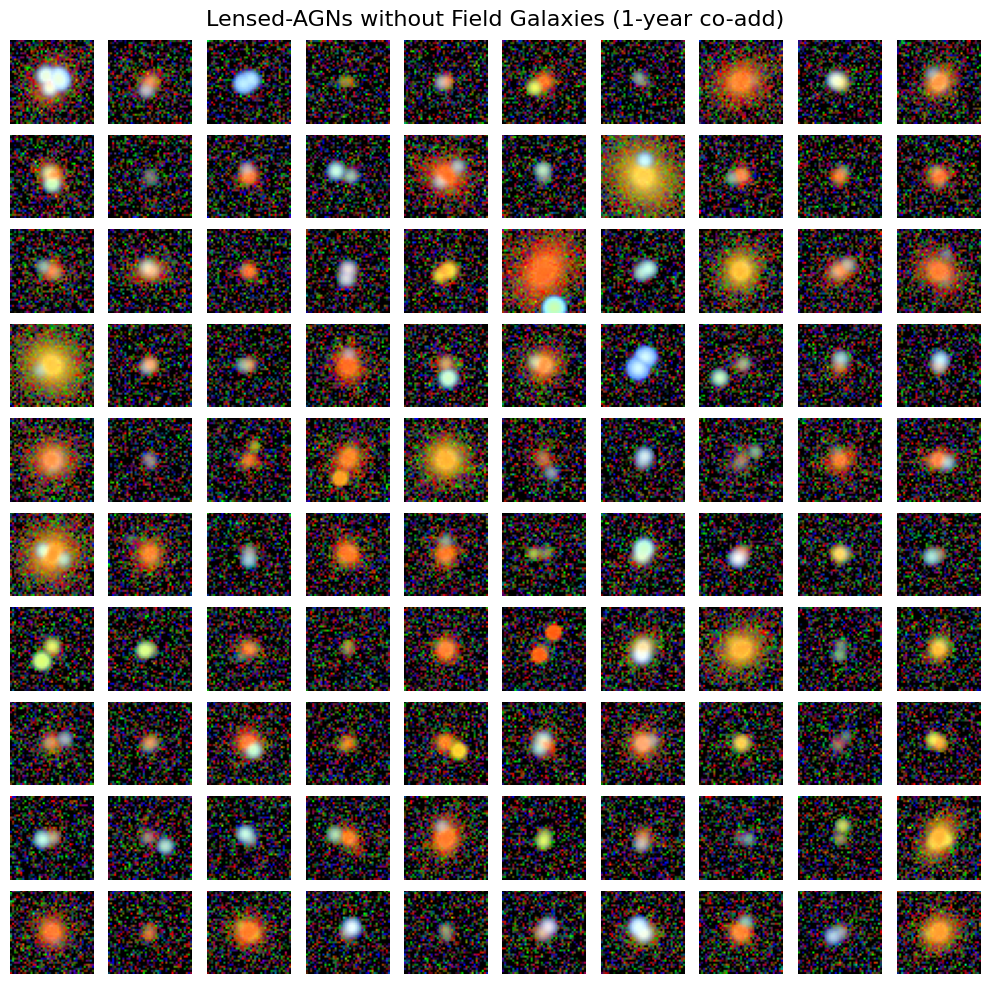

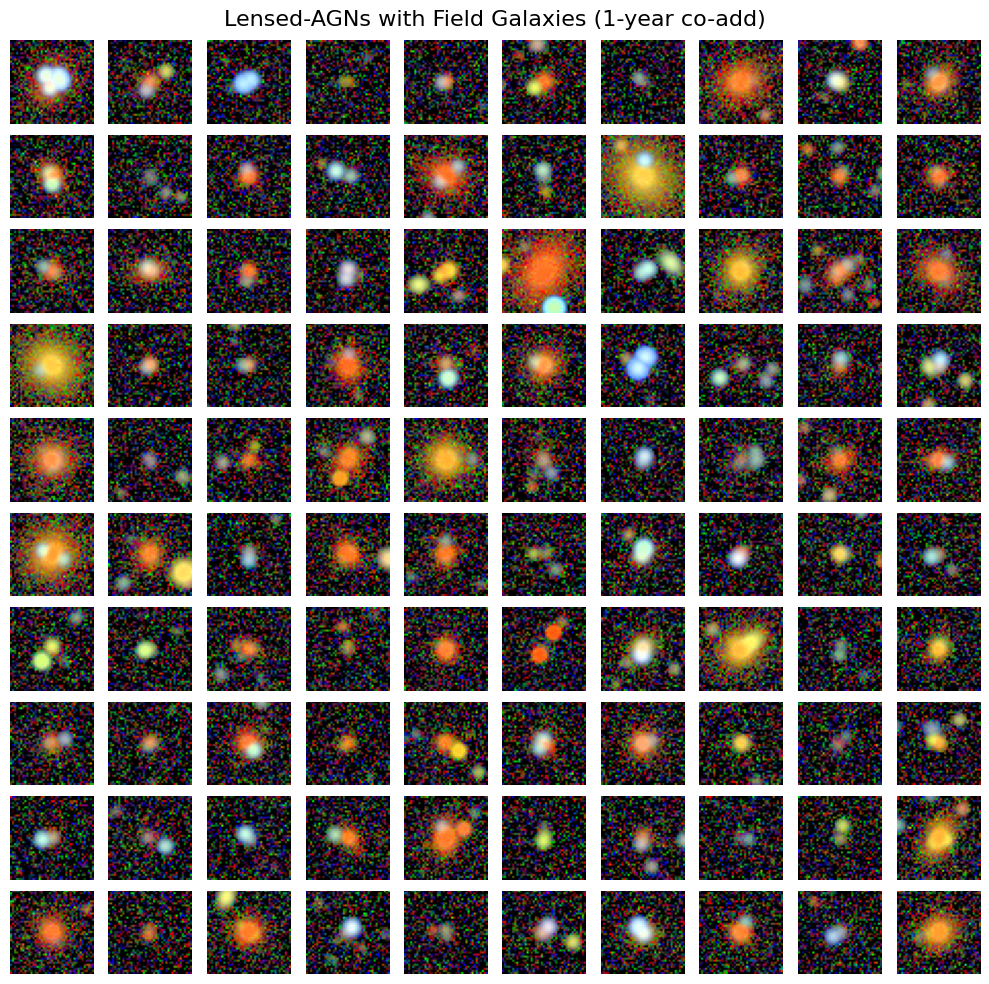

In [19]:
# plot montage of some selected lenses with and without field galaxies

# No field galaxies
plot_montage(lensed_quasars_all, number_to_plot=100, num_cols=10, coadd_years=1, add_noise=True, random_seed=4,
             plot_title="Lensed-AGNs without Field Galaxies (1-year co-add)");

# With field galaxies
plot_montage(lensed_quasars_all_with_field_galaxies, number_to_plot=100, num_cols=10, coadd_years=1, add_noise=True, random_seed=4,
                plot_title="Lensed-AGNs with Field Galaxies (1-year co-add)");

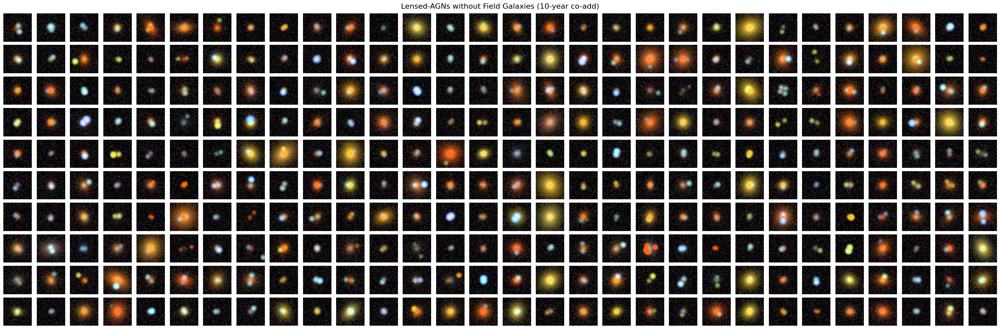

In [53]:
# plot montage of some selected lenses with and without field galaxies

# No field galaxies
plot_montage(lensed_quasars_all, number_to_plot=300, num_cols=30, coadd_years=10, add_noise=True, #random_seed=4,
             plot_title="Lensed-AGNs without Field Galaxies (10-year co-add)");

# With field galaxies
# plot_montage(lensed_quasars_all_with_field_galaxies, number_to_plot=300, num_cols=30, coadd_years=10, add_noise=True, #random_seed=4,
#                 plot_title="Lensed-AGNs with Field Galaxies (10-year co-add)");

## Histograms of various properties of the lensed AGN systems

In [8]:
# ==========================================
# Cell 6: Load the Extracted Catalog Table
# ==========================================
import glob

# Find the saved table (handles the dynamic length in the filename)
table_files = glob.glob("../data/lenses/table_lensed_quasars_*.fits")

if len(table_files) > 0:
    table_path = table_files[0]
    print(f"Loading catalog from: {table_path}")
    cat = Table.read(table_path, format='fits')
    print(f"Loaded {len(cat)} lensed systems for histogram analysis.")
else:
    print("Error: Could not find the catalog table. Run Notebook 3.")

Loading catalog from: ../data/lenses/table_lensed_quasars_50000.fits
Loaded 50000 lensed systems for histogram analysis.


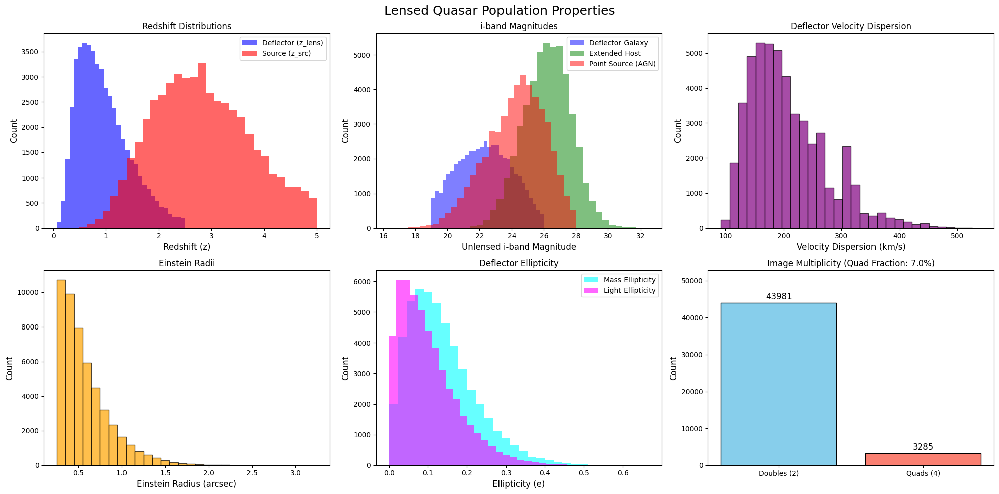

In [14]:
# ==========================================
# Cell 7: Plot Parameter Histograms
# ==========================================
import matplotlib.pyplot as plt

# Set up a 3x2 grid of plots
fig, axes = plt.subplots(2, 3, figsize=(20, 10))
fig.suptitle("Lensed Quasar Population Properties", fontsize=18, y=0.98)

# ------------------------------------------
# 1. Redshifts (Deflector vs Source)
# ------------------------------------------
axes[0, 0].hist(cat['zlens'], bins=30, alpha=0.6, color='blue', label='Deflector (z_lens)')
axes[0, 0].hist(cat['zsrc'], bins=30, alpha=0.6, color='red', label='Source (z_src)')
axes[0, 0].set_xlabel('Redshift (z)', fontsize=12)
axes[0, 0].set_ylabel('Count', fontsize=12)
axes[0, 0].set_title('Redshift Distributions')
axes[0, 0].legend()

# ------------------------------------------
# 2. i-band Magnitudes (Unlensed)
# ------------------------------------------
axes[0, 1].hist(cat['mag_lens_i'], bins=30, alpha=0.5, color='blue', label='Deflector Galaxy')
axes[0, 1].hist(cat['mag_src_i'], bins=30, alpha=0.5, color='green', label='Extended Host')
axes[0, 1].hist(cat['mag_ps_i'], bins=30, alpha=0.5, color='red', label='Point Source (AGN)')
axes[0, 1].set_xlabel('Unlensed i-band Magnitude', fontsize=12)
axes[0, 1].set_ylabel('Count', fontsize=12)
axes[0, 1].set_title('i-band Magnitudes')
axes[0, 1].legend()

# ------------------------------------------
# 3. Velocity Dispersion
# ------------------------------------------
axes[0, 2].hist(cat['vel_disp'], bins=30, alpha=0.7, color='purple', edgecolor='black')
axes[0, 2].set_xlabel('Velocity Dispersion (km/s)', fontsize=12)
axes[0, 2].set_ylabel('Count', fontsize=12)
axes[0, 2].set_title('Deflector Velocity Dispersion')

# ------------------------------------------
# 4. Einstein Radius
# ------------------------------------------
axes[1, 0].hist(cat['Rein'], bins=30, alpha=0.7, color='orange', edgecolor='black')
axes[1, 0].set_xlabel('Einstein Radius (arcsec)', fontsize=12)
axes[1, 0].set_ylabel('Count', fontsize=12)
axes[1, 0].set_title('Einstein Radii')

# ------------------------------------------
# 5. Ellipticities (Mass vs Light)
# ------------------------------------------
axes[1, 1].hist(cat['ell_m'], bins=30, alpha=0.6, color='cyan', label='Mass Ellipticity')
axes[1, 1].hist(cat['ell_l'], bins=30, alpha=0.6, color='magenta', label='Light Ellipticity')
axes[1, 1].set_xlabel('Ellipticity (e)', fontsize=12)
axes[1, 1].set_ylabel('Count', fontsize=12)
axes[1, 1].set_title('Deflector Ellipticity')
axes[1, 1].legend()

# ------------------------------------------
# 6. Image Multiplicity (Doubles vs Quads)
# ------------------------------------------
doubles = np.sum(cat['num_images'] == 2)
quads = np.sum(cat['num_images'] == 4)
total = doubles + quads
quad_fraction = (quads / total) * 100 if total > 0 else 0

axes[1, 2].bar(['Doubles (2)', 'Quads (4)'], [doubles, quads], color=['skyblue', 'salmon'], edgecolor='black')
axes[1, 2].set_ylabel('Count', fontsize=12)
axes[1, 2].set_title(f'Image Multiplicity (Quad Fraction: {quad_fraction:.1f}%)')

# Add text labels on top of the bars
axes[1, 2].text(0, doubles + (total*0.02), str(doubles), ha='center', fontsize=12)
axes[1, 2].text(1, quads + (total*0.02), str(quads), ha='center', fontsize=12)

axes[1, 2].set_ylim(0, max(doubles, quads) * 1.2)

plt.tight_layout()
plt.show()

Generating corner plot for 50000 valid systems...


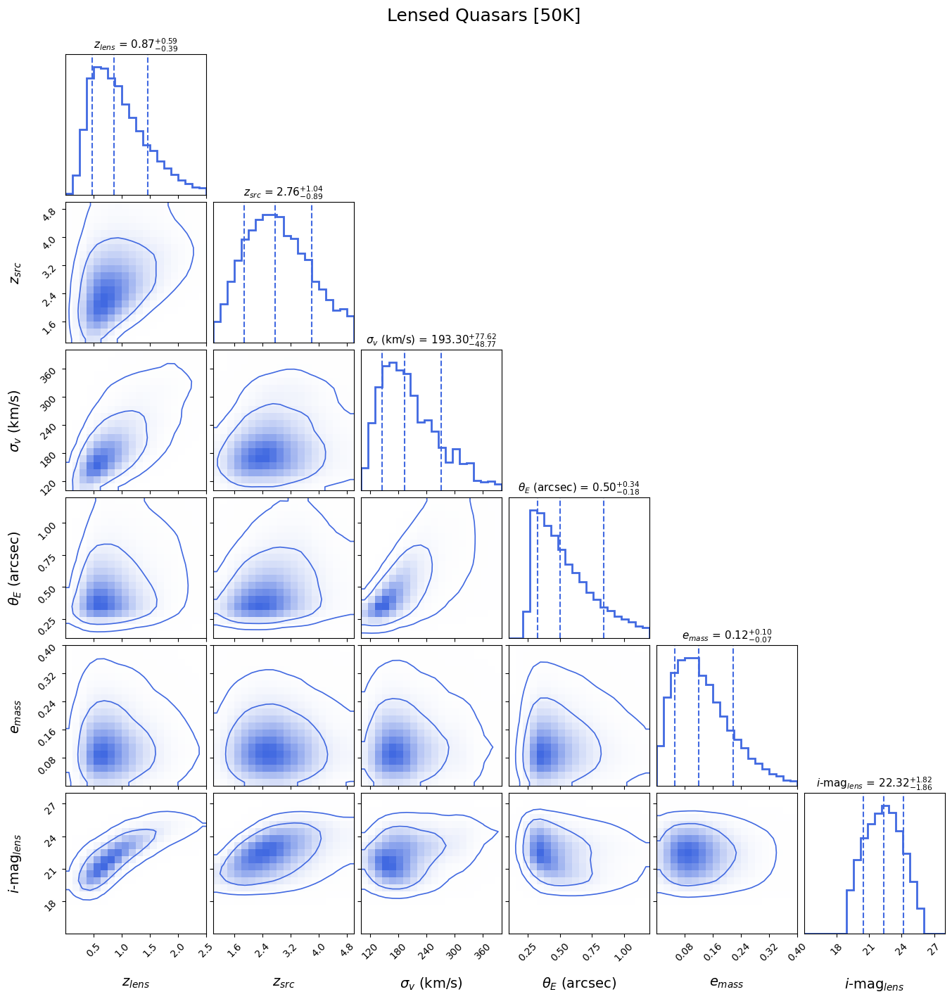

In [42]:
# ==========================================
# Cell 8: Corner Plot of Key Degeneracies
# ==========================================
import numpy as np
import matplotlib.pyplot as plt
import corner

# 1. Define the parameters you want to cross-correlate
# (Feel free to add or remove columns from these lists, but keep it < 8 for readability)
columns_to_plot = ['zlens', 'zsrc', 'vel_disp', 'Rein', 'ell_m', 'mag_lens_i']
plot_labels = [
    r"$z_{lens}$", 
    r"$z_{src}$", 
    r"$\sigma_v$ (km/s)", 
    r"$\theta_E$ (arcsec)", 
    r"$e_{mass}$", 
    r"$i$-mag$_{lens}$"
]

# 2. Extract the data into a 2D numpy array
data_list = [cat[col] for col in columns_to_plot]
data_array = np.vstack(data_list).T

# 3. Clean the data (Corner plots will crash if there are NaNs or Infs)
valid_rows = ~np.isnan(data_array).any(axis=1) & ~np.isinf(data_array).any(axis=1)
clean_data = data_array[valid_rows]

print(f"Generating corner plot for {len(clean_data)} valid systems...")

ranges = [
    (0.0, 2.5),   # zlens
    (1.0, 5.0),   # zsrc
    (100, 400),   # vel_disp
    (0.1, 1.2),   # Rein
    (0.0, 0.4),   # ell_m
    (15, 28)      # mag_lens_i
]

# 4. Generate the Corner Plot
fig = corner.corner(
    clean_data,
    labels=plot_labels,
    range=ranges,
    show_titles=True,                  # Shows median and 1-sigma uncertainties above 1D hists
    title_kwargs={"fontsize": 11},
    label_kwargs={"fontsize": 14},
    quantiles=[0.16, 0.5, 0.84],       # Plots the 16th, 50th, and 84th percentiles
    color="royalblue",                 # Fits your existing color scheme
    hist_kwargs={"linewidth": 2},
    contour_kwargs={"linewidths": 1.2},
    figsize=(12, 12),
    plot_datapoints=False,             # Set to True to show individual data points (can be noisy with large samples
    levels=(0.68, 0.95),
    smooth=1.0
)

# Add a main title slightly above the subplots
fig.suptitle("Lensed Quasars [50K]", fontsize=18, y=1.02)

plt.show()

Plotting 43981 Doubles and 3285 Quads...


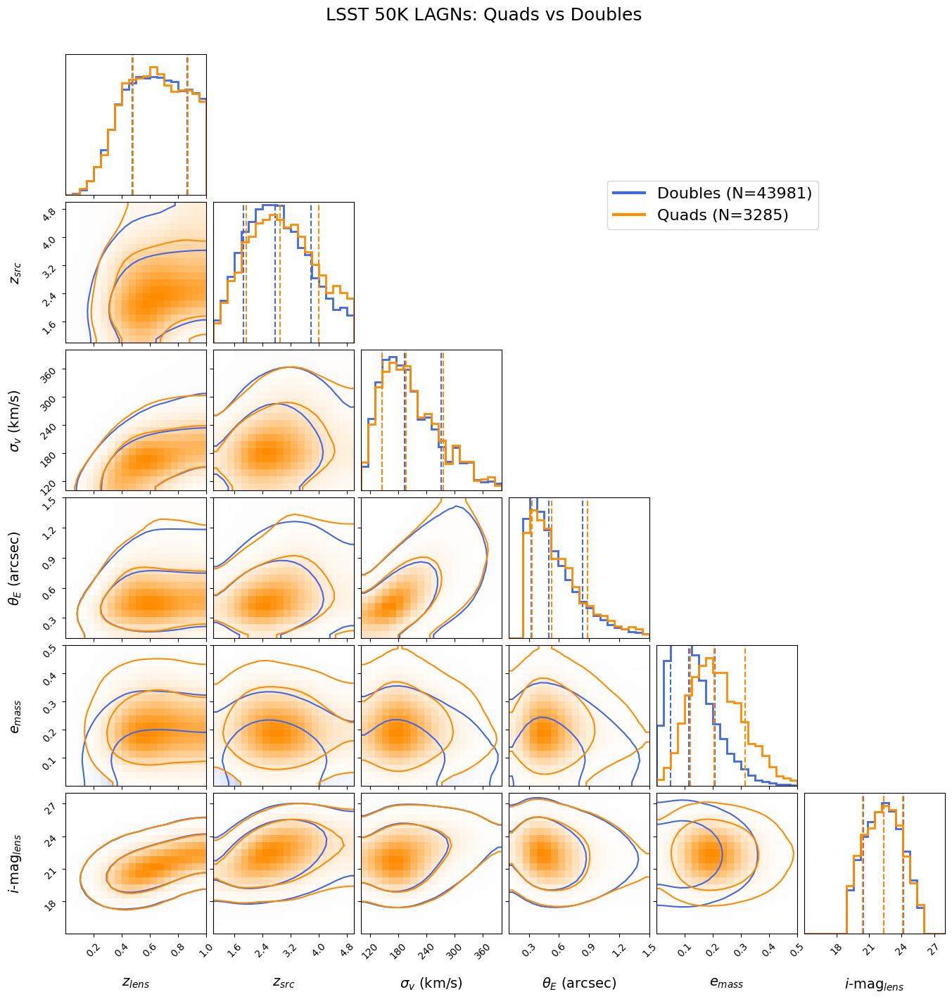

In [50]:
# ==========================================
# Cell 8: Corner Plot Comparing Quads vs Doubles
# ==========================================
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import corner

# 1. Define the parameters and ranges
columns_to_plot = ['zlens', 'zsrc', 'vel_disp', 'Rein', 'ell_m', 'mag_lens_i']
plot_labels = [
    r"$z_{lens}$", 
    r"$z_{src}$", 
    r"$\sigma_v$ (km/s)", 
    r"$\theta_E$ (arcsec)", 
    r"$e_{mass}$", 
    r"$i$-mag$_{lens}$"
]

ranges = [
    (0.0, 1.0),   # zlens
    (1.0, 5.0),   # zsrc
    (100, 400),   # vel_disp
    (0.1, 1.5),   # Rein
    (0.0, 0.5),   # ell_m
    (15, 28)      # mag_lens_i
]

# 2. Helper function to extract and clean data subsets
def get_clean_data(catalog_subset, cols):
    data = np.vstack([catalog_subset[col] for col in cols]).T
    valid = ~np.isnan(data).any(axis=1) & ~np.isinf(data).any(axis=1)
    return data[valid]

# 3. Split the catalog into Doubles and Quads
cat_doubles = cat[cat['num_images'] == 2]
cat_quads = cat[cat['num_images'] == 4]

data_doubles = get_clean_data(cat_doubles, columns_to_plot)
data_quads = get_clean_data(cat_quads, columns_to_plot)

print(f"Plotting {len(data_doubles)} Doubles and {len(data_quads)} Quads...")

# 4. Flat shared kwargs (NO nested dictionaries here to avoid mutation bugs)
shared_kwargs = dict(
    labels=plot_labels,
    range=ranges,
    show_titles=False,
    label_kwargs={"fontsize": 14},
    quantiles=[0.16, 0.5, 0.84],
    plot_datapoints=False,
    # plot_density=False,                # <--- Turn off solid shading so contours don't hide each other
    levels=(0.68, 0.95),
    smooth=2.0,
    figsize=(12, 12),
)

# 5. Plot the Doubles first (Base Layer)
fig = corner.corner(
    data_doubles, 
    color="royalblue", 
    hist_kwargs={"linewidth": 2, "density": True},     # Explicitly defined here
    contour_kwargs={"linewidths": 1.5},                # Explicitly defined here
    **shared_kwargs
)

# 6. Plot the Quads on top (Pass fig=fig to overlay)
corner.corner(
    data_quads, 
    color="darkorange", 
    fig=fig,                           
    hist_kwargs={"linewidth": 2, "density": True},     # Explicitly defined here
    contour_kwargs={"linewidths": 1.5},                # Explicitly defined here
    **shared_kwargs
)

# 7. Create a custom legend
blue_line = mlines.Line2D([], [], color='royalblue', label=f'Doubles (N={len(data_doubles)})', linewidth=3)
orange_line = mlines.Line2D([], [], color='darkorange', label=f'Quads (N={len(data_quads)})', linewidth=3)
fig.legend(handles=[blue_line, orange_line], fontsize=16, loc='upper right', bbox_to_anchor=(0.85, 0.85))

# Add main title
fig.suptitle("LSST 50K LAGNs: Quads vs Doubles", fontsize=18, y=1.02)

plt.show()